## Introduction

In this notebook, three lakes of Bangalore West are explored using the Pystac api for the following lakes:

- Lakes SG Kaval
- Malathalli
- Herohalli

In this notebook, some satellite images around the three lakes for a given period are downloaded. From these an animation can be created.

<!-- This code follows the code from this article:
https://towardsdatascience.com/a-simple-way-for-downloading-hundreds-of-clipped-satellite-images-without-retrieving-the-entire-f22d97501fd3 -->

Next to this article, also some indices can be computed:

- Modified Normalized Difference Water Index (MNDWI)
- NDVI
- Automated Water Extraction Index (AWEI)

This notebook uses Sentinel 2 instead of Landsat. Although with Landsat we can go further back in time, the resolution of Sentinel 2 data (10 metres) whereas for Landsat the data is 30 metres. However, using the steps below it is possible to use Landsat instead. Below, a link is given on how to change the catalog settings in case Landsat will be used.

In this example, we will not take many data to start with but will use the year 2023 only but the parameters below can be adjusted for different and/or longer time periods. Also, the code will need to be done neater and written in functions.

While there exist different datasets with the extent of the lakes, this notebook focuses on only one such a dataset. More specifically, the following dataset is used: [Map of Lakes and Streams of Bengaluru Urban Within BBMP area from ATREE-CSEI](https://data.opencity.in/dataset/map-lakes-streams-bengaluru-urban-within-bbmp-area).

In [4]:
!pip install pystac-client opencity beautifulsoup4 matplotlib mapclassify osmnx leafmap stackstac rioxarray --quiet

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.4/99.4 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 508.7/508.7 kB 19.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.3/64.3 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.9/183.9 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 62.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.7/213.7 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 58.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.1/6.1 MB 67.5 MB/s eta 0:00:00
   ━━━━━━━━

## Reading in the data and selecting the lakes for Bangalore West:

- Herohalli Lake
- Malathahalli Lake
- Srigandhakavalu Karabu Katte (SGKaval lake/)

Several datasets were given. As of now, one dataset only is explored but a more thorough analysis could be done where the different datasets could be compared.

The dataset chosen is:

Herohalli Lake

In [5]:
import requests
import fiona
import folium
import geopandas as gpd
import json
import numpy as np
from pystac_client import Client
from shapely.geometry import mapping
from urllib.request import urlopen
import osmnx as ox
import re
import rich
import stackstac
import rioxarray as rio

import matplotlib.pyplot as plt

In [6]:
print(gpd.__version__)

1.0.1


In [7]:
link = "https://data.opencity.in/dataset/map-lakes-streams-bengaluru-urban-within-bbmp-area"
# https://stackoverflow.com/questions/32169421/how-do-i-overcome-python-http-client-httpresponse-objects
with urlopen(link) as x:
     data = x.read().decode('utf-8')
# print(data)

## Need to fix this code still and fetch the href and the dropdown data
## https://data.opencity.in/dataset/b0f68537-2bce-4659-9171-9fb0ed3e4bcb/resource/d936310f-aba1-4b2b-aa34-663977917df7/download/bbmp_lakes_masterlist-final.kml

In [8]:
from bs4 import BeautifulSoup
soup = BeautifulSoup(data)
## print(soup.prettify()) # Uncomment to see the content

# Now extract the links for the dropdown or href:
# for link in soup.findAll('a'):
#     print(link.get('href'))

In [9]:
list_url = []
for link in soup.findAll('a', attrs={'href': re.compile("^https://data")}):
  # print(link)
  httpslink = link['href']
  # print(httpslink)
  list_url.append(httpslink)

In [10]:
list_url

['https://data.opencity.in/dataset/b0f68537-2bce-4659-9171-9fb0ed3e4bcb/resource/d936310f-aba1-4b2b-aa34-663977917df7/download/bbmp_lakes_masterlist-final.kml',
 'https://data.opencity.in/dataset/b0f68537-2bce-4659-9171-9fb0ed3e4bcb/resource/23141cb5-471e-4796-af80-4311819fd031/download/bbmp_streamnetwork.kml',
 'https://data.opencity.in/dataset/b0f68537-2bce-4659-9171-9fb0ed3e4bcb/resource/dae235c7-89a9-48de-be2c-5c19621b1ecb/download/bbmp_lakes_streams.kml',
 'https://data.opencity.in/dataset/b0f68537-2bce-4659-9171-9fb0ed3e4bcb/resource/d936310f-aba1-4b2b-aa34-663977917df7/download/bbmp_lakes_masterlist-final.kml',
 'https://data.opencity.in/dataset/b0f68537-2bce-4659-9171-9fb0ed3e4bcb/resource/23141cb5-471e-4796-af80-4311819fd031/download/bbmp_streamnetwork.kml',
 'https://data.opencity.in/dataset/b0f68537-2bce-4659-9171-9fb0ed3e4bcb/resource/dae235c7-89a9-48de-be2c-5c19621b1ecb/download/bbmp_lakes_streams.kml']

In [11]:
# Let us grab one dataset now from that:
lake_link = list_url[3]
lake_link

'https://data.opencity.in/dataset/b0f68537-2bce-4659-9171-9fb0ed3e4bcb/resource/d936310f-aba1-4b2b-aa34-663977917df7/download/bbmp_lakes_masterlist-final.kml'

In [12]:
!wget https://data.opencity.in/dataset/b0f68537-2bce-4659-9171-9fb0ed3e4bcb/resource/d936310f-aba1-4b2b-aa34-663977917df7/download/bbmp_lakes_masterlist-final.kml

--2024-12-06 18:32:39--  https://data.opencity.in/dataset/b0f68537-2bce-4659-9171-9fb0ed3e4bcb/resource/d936310f-aba1-4b2b-aa34-663977917df7/download/bbmp_lakes_masterlist-final.kml
Resolving data.opencity.in (data.opencity.in)... 165.22.209.168
Connecting to data.opencity.in (data.opencity.in)|165.22.209.168|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 493881 (482K) [application/vnd.google-earth.kml+xml]
Saving to: ‘bbmp_lakes_masterlist-final.kml’

bbmp_lakes_masterli 100%[===================>] 482.31K   509KB/s    in 0.9s    

2024-12-06 18:32:41 (509 KB/s) - ‘bbmp_lakes_masterlist-final.kml’ saved [493881/493881]



In [13]:
df = gpd.read_file('/content/bbmp_lakes_masterlist-final.kml')
df

,Name,Description,geometry
0,Alahalli Kere,,"MULTIPOLYGON Z (((77.56546 12.86654 0, 77.5654..."
1,Doddakallasandra kere,,"MULTIPOLYGON Z (((77.5626 12.88125 0, 77.5626 ..."
2,Thalagattapura lake,,"MULTIPOLYGON Z (((77.52983 12.86587 0, 77.5304..."
3,Kembathahali kere,,"MULTIPOLYGON Z (((77.57719 12.85765 0, 77.5767..."
4,Vajarahalli Govt.Katte,,"MULTIPOLYGON Z (((77.54379 12.86789 0, 77.5434..."
...,...,...,...
176,Kodigehalli kere,,"MULTIPOLYGON Z (((77.46722 12.97632 0, 77.4672..."
177,Kommaghatta Govt. Lake,,"MULTIPOLYGON Z (((77.46546 12.92974 0, 77.4656..."
178,Manganahalli Lake,,"MULTIPOLYGON Z (((77.46106 12.94763 0, 77.4609..."
179,Mylasandra Dodda Agrahara kere,,"MULTIPOLYGON Z (((77.62278 12.85877 0, 77.6229..."


Extract the area of Bangalore. You can again use the Opencity data or just do it quickly using the osmnx library:

In [14]:
bangalore = ox.geocode_to_gdf("Bangalore, India")
# bangalore.plot()

In [15]:
# df.plot()

In [16]:
# Plot the two geopandas dataframes one on top of the other (static):

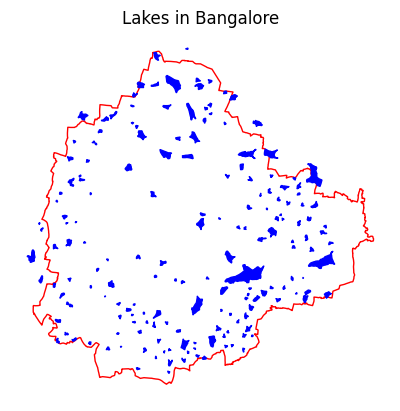

In [17]:
f, ax = plt.subplots()
bangalore.plot(facecolor = 'none', edgecolor = "red", ax = ax)
df.plot(ax = ax, facecolor="blue", edgecolor="blue")
ax.set_axis_off()
# plt.savefig(fig_1_path)
plt.title('Lakes in Bangalore')
plt.show()

In [16]:
# Make an interactive plot from this.

In [18]:
# Strange that the following code does not work in Google Colab (works on local)
# df = gpd.read_file(lake_link, driver = 'KML', engine = "fiona") # This throws an error

In [18]:
# Alternative code:
# If you have the data on Google Drive, this is the code that you could use
# Reading from Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

In [19]:
# import os
# os.listdir('/content/drive/MyDrive/datajam_lakes/Map of Lakes and Streams of Bengaluru Urban Within BBMP area')

In [20]:
# df = gpd.read_file('/content/drive/MyDrive/datajam_lakes/Map of Lakes and Streams of Bengaluru Urban Within BBMP area/bbmp_lakes_masterlist-final.kml')

In [21]:
# df.head()

Let us extract one lake as an example:

In [19]:
lake_example = df[df['Name'] == 'Herohalli Lake']
lake_example

,Name,Description,geometry
125,Herohalli Lake,,"MULTIPOLYGON Z (((77.4892 12.98723 0, 77.48904..."


<Axes: >

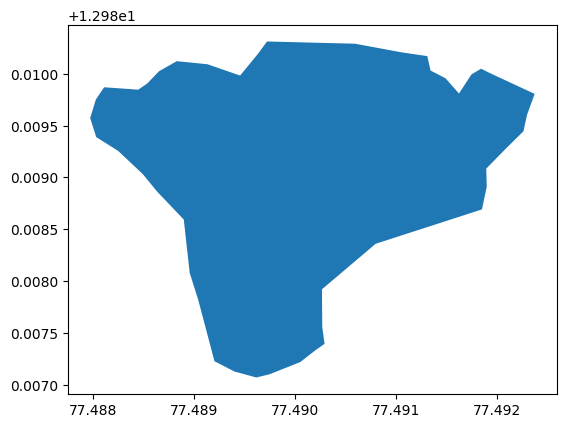

In [20]:
lake_example.plot()

Fix pop up etc.

TO ADD THE OTHER LAKES

In [83]:
# Show with Folium:
m = lake_example.explore(color = 'darkblue')
# Add also Bangalore:
bangalore.explore(m = m, fill = False, color = 'red')
# Add also the other lakes:
folium.LayerControl().add_to(m)
# m # Uncomment to see - To save on memory in github

Alternatively, you can also use Leafmap which will have even a Google maps background:

In [22]:
import leafmap.foliumap as leafmap

The code of Dr. Quisheng Wu is used who is the maker of the Leafmap package:

In [23]:
geom = lake_example.geometry.__geo_interface__
bounding_box = geom['bbox']
bounding_box

(77.4879709192357, 12.9870683026339, 77.4923744445237, 12.9903120265958)

In [30]:
# lake_example.bounds # longitude, latitude

In [31]:
# lake_example_reproj = lake_example.to_crs('32643')
# exterior = lake_example_reproj.bounds
# exterior

## Extracting the main Sentinel 2 data

In [24]:
catalog = Client.open('https://earth-search.aws.element84.com/v1')
collections = catalog.get_all_collections()

for col in collections:
  print(col)

<CollectionClient id=sentinel-2-pre-c1-l2a>
<CollectionClient id=cop-dem-glo-30>
<CollectionClient id=naip>
<CollectionClient id=cop-dem-glo-90>
<CollectionClient id=landsat-c2-l2>
<CollectionClient id=sentinel-2-l2a>
<CollectionClient id=sentinel-2-l1c>
<CollectionClient id=sentinel-2-c1-l2a>
<CollectionClient id=sentinel-1-grd>


First, we need to create the bounding box of the lake as this is needed for the following step:

Create a bounding box around the lake after which we will buffer the area.

The sentinel-2-l2a dataset is selected. Before proceeding, let us set some parameters. Later on, this can be put into a Python function.

In [25]:
# These parameters can be changed according to your interest

# Collection
col = 'sentinel-2-l2a'
# selecting the time period for the year 2023 (as an example)
time_period = "2023-01-01/2023-12-30"
# To filter out the images that have to
cloud_cover_cutoff = 15 # Set this to 100 if you want to have all the images
bbox = bounding_box

Call the pystac API and fetch the data based on the parameters given (you can change that):


In [26]:
#https://pystac-client.readthedocs.io/en/latest/tutorials/item-search-intersects.html
%%time
items = catalog.search(
    # intersects = intersection, # If we work with geometry
    bbox = bbox,
    collections=col,
    datetime=time_period,
    query={"eo:cloud_cover": {"lt": cloud_cover_cutoff}}
).item_collection()
len(items)

CPU times: user 42.9 ms, sys: 3.11 ms, total: 46 ms
Wall time: 300 ms


18

In [30]:
items

## Showing some images of the collection (RGB):

In [118]:
items_df = gpd.GeoDataFrame.from_features(items.to_dict(), crs='EPSG:4326')
items_df

,geometry,created,platform,constellation,instruments,eo:cloud_cover,proj:epsg,mgrs:utm_zone,mgrs:latitude_band,mgrs:grid_square,...,s2:datastrip_id,s2:granule_id,s2:reflectance_conversion_factor,datetime,s2:sequence,earthsearch:s3_path,earthsearch:payload_id,earthsearch:boa_offset_applied,processing:software,updated
0,"POLYGON ((76.91777 13.56108, 76.84536 13.22704...",2023-11-19T09:56:13.215Z,sentinel-2a,sentinel-2,[msi],12.353111,32643,43,P,GQ,...,S2A_OPER_MSI_L2A_DS_2APS_20231119T082558_S2023...,S2A_OPER_MSI_L2A_TL_2APS_20231119T082558_A0439...,1.022376,2023-11-19T05:25:17.160000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/43/P/G...,roda-sentinel2/workflow-sentinel2-to-stac/929c...,True,{'sentinel2-to-stac': '0.1.1'},2023-11-19T09:56:13.215Z
1,"POLYGON ((76.92553 13.56102, 76.84515 13.19949...",2023-10-25T10:57:23.564Z,sentinel-2b,sentinel-2,[msi],0.126367,32643,43,P,GQ,...,S2B_OPER_MSI_L2A_DS_2BPS_20231025T081556_S2023...,S2B_OPER_MSI_L2A_TL_2BPS_20231025T081556_A0346...,1.009565,2023-10-25T05:25:20.636000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/43/P/G...,roda-sentinel2/workflow-sentinel2-to-stac/f333...,True,{'sentinel2-to-stac': '0.1.1'},2023-10-25T10:57:23.564Z
2,"POLYGON ((76.92239 13.56104, 76.84527 13.21523...",2023-10-20T12:53:38.560Z,sentinel-2a,sentinel-2,[msi],6.556788,32643,43,P,GQ,...,S2A_OPER_MSI_L2A_DS_2APS_20231020T090601_S2023...,S2A_OPER_MSI_L2A_TL_2APS_20231020T090601_A0434...,1.006739,2023-10-20T05:25:19.623000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/43/P/G...,roda-sentinel2/workflow-sentinel2-to-stac/efec...,True,{'sentinel2-to-stac': '0.1.1'},2023-10-20T12:53:38.560Z
3,"POLYGON ((76.91564 13.56109, 77.86186 13.55204...",2023-05-28T12:03:37.016Z,sentinel-2b,sentinel-2,[msi],2.518261,32643,43,P,GQ,...,S2B_OPER_MSI_L2A_DS_2BPS_20230528T074759_S2023...,S2B_OPER_MSI_L2A_TL_2BPS_20230528T074759_A0325...,0.975342,2023-05-28T05:25:24.277000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/43/P/G...,roda-sentinel2/workflow-sentinel2-to-stac/9969...,True,{'sentinel2-to-stac': '0.1.0'},2023-05-28T12:03:37.016Z
4,"POLYGON ((76.91223 13.56112, 77.86186 13.55204...",2023-05-18T15:37:09.260Z,sentinel-2b,sentinel-2,[msi],4.636491,32643,43,P,GQ,...,S2B_OPER_MSI_L2A_DS_2BPS_20230518T091909_S2023...,S2B_OPER_MSI_L2A_TL_2BPS_20230518T091909_A0323...,0.979355,2023-05-18T05:25:24.510000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/43/P/G...,roda-sentinel2/workflow-sentinel2-to-stac/43b4...,True,{'sentinel2-to-stac': '0.1.0'},2023-05-18T15:37:09.260Z
5,"POLYGON ((76.91389 13.56111, 77.86186 13.55204...",2023-04-23T14:46:36.836Z,sentinel-2a,sentinel-2,[msi],4.642225,32643,43,P,GQ,...,S2A_OPER_MSI_L2A_DS_2APS_20230423T100202_S2023...,S2A_OPER_MSI_L2A_TL_2APS_20230423T100202_A0409...,0.991858,2023-04-23T05:25:19.024000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/43/P/G...,roda-sentinel2/workflow-sentinel2-to-stac/8b5a...,True,{'sentinel2-to-stac': '0.1.0'},2023-04-23T14:46:36.836Z
6,"POLYGON ((76.90927 13.56114, 77.86186 13.55204...",2023-04-13T14:23:10.865Z,sentinel-2a,sentinel-2,[msi],0.000171,32643,43,P,GQ,...,S2A_OPER_MSI_L2A_DS_2APS_20230413T102555_S2023...,S2A_OPER_MSI_L2A_TL_2APS_20230413T102555_A0407...,0.997486,2023-04-13T05:25:19.864000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/43/P/G...,roda-sentinel2/workflow-sentinel2-to-stac/dd90...,True,{'sentinel2-to-stac': '0.1.0'},2023-04-13T14:23:10.865Z
7,"POLYGON ((76.91444 13.5611, 77.86186 13.55204,...",2023-04-03T14:24:16.248Z,sentinel-2a,sentinel-2,[msi],5.606341,32643,43,P,GQ,...,S2A_OPER_MSI_L2A_DS_2APS_20230403T085504_S2023...,S2A_OPER_MSI_L2A_TL_2APS_20230403T085504_A0406...,1.003237,2023-04-03T05:25:19.077000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/43/P/G...,roda-sentinel2/workflow-sentinel2-to-stac/8791...,True,{'sentinel2-to-stac': '0.1.0'},2023-04-03T14:24:16.248Z
8,"POLYGON ((76.91832 13.56107, 77.86186 13.55204...",2023-03-19T13:20:23.312Z,sentinel-2b,sentinel-2,[msi],13.843477,32643,43,P,GQ,...,S2B_OPER_MSI_L2A_DS_2BPS_20230319T074328_S2023...,S2B_OPER_MSI_L2

In [35]:
# Select item with least cloud cover
# https://stacspec.org/en/tutorials/reading-stac-planetary-computer/
selected_item = min(items, key=lambda item: item.properties["eo:cloud_cover"])
# selected_item # Print out to see what this consists off

In [36]:
for asset_key, asset in selected_item.assets.items():
    print(asset_key, asset.title)

aot Aerosol optical thickness (AOT)
blue Blue (band 2) - 10m
coastal Coastal aerosol (band 1) - 60m
granule_metadata None
green Green (band 3) - 10m
nir NIR 1 (band 8) - 10m
nir08 NIR 2 (band 8A) - 20m
nir09 NIR 3 (band 9) - 60m
red Red (band 4) - 10m
rededge1 Red edge 1 (band 5) - 20m
rededge2 Red edge 2 (band 6) - 20m
rededge3 Red edge 3 (band 7) - 20m
scl Scene classification map (SCL)
swir16 SWIR 1 (band 11) - 20m
swir22 SWIR 2 (band 12) - 20m
thumbnail Thumbnail image
tileinfo_metadata None
visual True color image
wvp Water vapour (WVP)
aot-jp2 Aerosol optical thickness (AOT)
blue-jp2 Blue (band 2) - 10m
coastal-jp2 Coastal aerosol (band 1) - 60m
green-jp2 Green (band 3) - 10m
nir-jp2 NIR 1 (band 8) - 10m
nir08-jp2 NIR 2 (band 8A) - 20m
nir09-jp2 NIR 3 (band 9) - 60m
red-jp2 Red (band 4) - 10m
rededge1-jp2 Red edge 1 (band 5) - 20m
rededge2-jp2 Red edge 2 (band 6) - 20m
rededge3-jp2 Red edge 3 (band 7) - 20m
scl-jp2 Scene classification map (SCL)
swir16-jp2 SWIR 1 (band 11) - 20m


In [37]:
print(selected_item.datetime)
print(selected_item.geometry)
print(selected_item.properties)

2023-04-13 05:25:19.864000+00:00
{'type': 'Polygon', 'coordinates': [[[76.90926924960792, 13.561141614582166], [77.86185827663547, 13.552040522490456], [77.85045784138613, 12.560413606130458], [76.84054354907092, 12.569253669512213], [76.84572432133918, 13.275413455708422], [76.90926924960792, 13.561141614582166]]]}
{'created': '2023-04-13T14:23:10.865Z', 'platform': 'sentinel-2a', 'constellation': 'sentinel-2', 'instruments': ['msi'], 'eo:cloud_cover': 0.000171, 'proj:epsg': 32643, 'mgrs:utm_zone': 43, 'mgrs:latitude_band': 'P', 'mgrs:grid_square': 'GQ', 'grid:code': 'MGRS-43PGQ', 'view:sun_azimuth': 98.8138984752254, 'view:sun_elevation': 68.5281977864777, 's2:degraded_msi_data_percentage': 0.0084, 's2:nodata_pixel_percentage': 0.850375, 's2:saturated_defective_pixel_percentage': 0, 's2:dark_features_percentage': 0.010962, 's2:cloud_shadow_percentage': 0, 's2:vegetation_percentage': 31.406128, 's2:not_vegetated_percentage': 66.398132, 's2:water_percentage': 1.633477, 's2:unclassified

In [333]:
# Let us grab the "visual" to see the tile:

In [38]:
selected_item.assets["thumbnail"].href

'https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/43/P/GQ/2023/4/S2A_43PGQ_20230413_0_L2A/thumbnail.jpg'

In [39]:
selected_item.assets["thumbnail"].href

'https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/43/P/GQ/2023/4/S2A_43PGQ_20230413_0_L2A/thumbnail.jpg'

In [40]:
#https://stacspec.org/en/tutorials/reading-stac-planetary-computer/
from IPython.display import Image

Image(url=selected_item.assets["thumbnail"].href)

Create now a stack of the images already using the smaller Area Of Interest:

In [41]:
%time
# stack = stackstac.stack(items, bounds_latlon = bbox).where(lambda x: x > 0, other=np.nan) # sentinel-2 uses 0 as nodata

CPU times: user 4 µs, sys: 1e+03 ns, total: 5 µs
Wall time: 8.58 µs


In [42]:
stack = stackstac.stack(items)

In [43]:
stack

<xarray.DataArray 'stackstac-987f0bee4fb378dd6aa3d0938ebb689e' (time: 18,
                                                                band: 32,
                                                                y: 10980,
                                                                x: 10980)> Size: 556GB
dask.array<fetch_raster_window, shape=(18, 32, 10980, 10980), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/52)
  * time                                     (time) datetime64[ns] 144B 2023-...
    id                                       (time) <U24 2kB 'S2B_43PGQ_20230...
  * band                                     (band) <U12 2kB 'aot' ... 'wvp-jp2'
  * x                                        (x) float64 88kB 7e+05 ... 8.098...
  * y                                        (y) float64 88kB 1.5e+06 ... 1.3...
    s2:datatake_id                           (time) <U34 2kB 'GS2B_20230108T0...
    ...                                       ...
    title                                    (band) <U31 4kB 'Aerosol optical...
    gsd                                      (band) object 256B None 10 ... None
    common_name                              (band) object 256B None ... None
    center_wavelength                        (band) object 256B None ... None
    full_width_half_max                      (band) object 256B None ... None
    epsg                                     int64 8B 32643
Attributes:
    spec:        RasterSpec(epsg=32643, bounds=(699960.0, 1390200.0, 809760.0...
    crs:         epsg:32643
    transform:   | 10.00, 0.00, 699960.00|\n| 0.00,-10.00, 1500000.00|\n| 0.0...
    resolution:  10.0

In [44]:
# As a check, we can clip to Bangalore
rgb = stack.isel(time=1).sel(band=['red', 'green', 'blue'])
rgb

<xarray.DataArray 'stackstac-987f0bee4fb378dd6aa3d0938ebb689e' (band: 3,
                                                                y: 10980,
                                                                x: 10980)> Size: 3GB
dask.array<getitem, shape=(3, 10980, 10980), dtype=float64, chunksize=(1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/52)
    time                                     datetime64[ns] 8B 2023-01-18T05:...
    id                                       <U24 96B 'S2B_43PGQ_20230118_0_L2A'
  * band                                     (band) <U12 144B 'red' ... 'blue'
  * x                                        (x) float64 88kB 7e+05 ... 8.098...
  * y                                        (y) float64 88kB 1.5e+06 ... 1.3...
    s2:datatake_id                           <U34 136B 'GS2B_20230118T051139_...
    ...                                       ...
    title                                    (band) <U31 372B 'Red (band 4) -...
    gsd                                      (band) object 24B 10 10 10
    common_name                              (band) object 24B 'red' ... 'blue'
    center_wavelength                        (band) object 24B 0.665 0.56 0.49
    full_width_half_max                      (band) object 24B 0.038 0.045 0.098
    epsg                                     int64 8B 32643
Attributes:
    spec:        RasterSpec(epsg=32643, bounds=(699960.0, 1390200.0, 809760.0...
    crs:         epsg:32643
    transform:   | 10.00, 0.00, 699960.00|\n| 0.00,-10.00, 1500000.00|\n| 0.0...
    resolution:  10.0

In [45]:
rgb.crs

'epsg:32643'

In [46]:
bangalore.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [47]:
bangalore_reproj = bangalore.to_crs(rgb.crs)
bangalore_reproj.geometry

,geometry
0,"POLYGON ((766946.625 1427917.998, 766955.686 1..."


In [48]:
rgb_clipped = rgb.rio.clip(bangalore_reproj.geometry)
rgb_clipped

<xarray.DataArray 'stackstac-987f0bee4fb378dd6aa3d0938ebb689e' (band: 3,
                                                                y: 3420, x: 3514)> Size: 288MB
dask.array<getitem, shape=(3, 3420, 3514), dtype=float64, chunksize=(1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/53)
    time                                     datetime64[ns] 8B 2023-01-18T05:...
    id                                       <U24 96B 'S2B_43PGQ_20230118_0_L2A'
  * band                                     (band) <U12 144B 'red' ... 'blue'
  * x                                        (x) float64 28kB 7.67e+05 ... 8....
  * y                                        (y) float64 27kB 1.454e+06 ... 1...
    s2:datatake_id                           <U34 136B 'GS2B_20230118T051139_...
    ...                                       ...
    gsd                                      (band) object 24B 10 10 10
    common_name                              (band) object 24B 'red' ... 'blue'
    center_wavelength                        (band) object 24B 0.665 0.56 0.49
    full_width_half_max                      (band) object 24B 0.038 0.045 0.098
    epsg                                     int64 8B 32643
    spatial_ref                              int64 8B 0
Attributes:
    spec:        RasterSpec(epsg=32643, bounds=(699960.0, 1390200.0, 809760.0...
    resolution:  10.0

TO DO: Create a better plot and embed in matplotlib

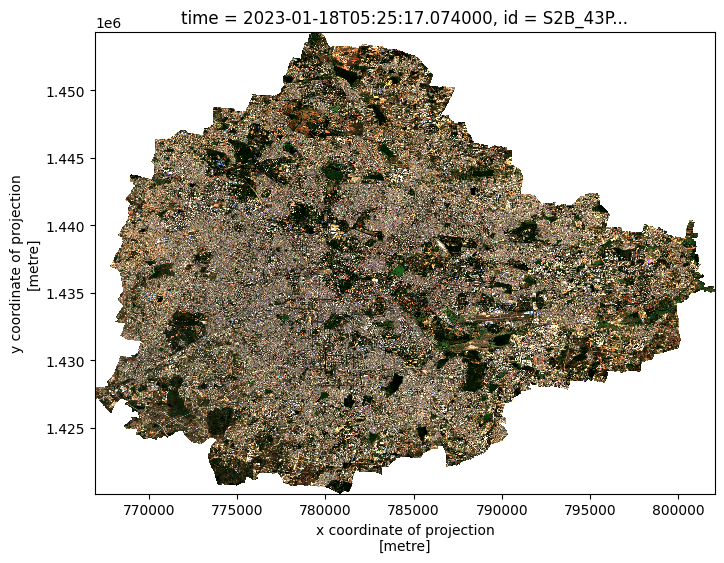

In [95]:
rgb_clipped.plot.imshow(robust=True, size=6); # Make the plot nicer. Put around matplotlib

In [50]:
stack_small = stackstac.stack(items, bounds_latlon = bbox)
stack_small

<xarray.DataArray 'stackstac-8ee9dc36a6ff8e430998c375ac97b87b' (time: 18,
                                                                band: 32,
                                                                y: 37, x: 49)> Size: 8MB
dask.array<fetch_raster_window, shape=(18, 32, 37, 49), dtype=float64, chunksize=(1, 1, 37, 49), chunktype=numpy.ndarray>
Coordinates: (12/52)
  * time                                     (time) datetime64[ns] 144B 2023-...
    id                                       (time) <U24 2kB 'S2B_43PGQ_20230...
  * band                                     (band) <U12 2kB 'aot' ... 'wvp-jp2'
  * x                                        (x) float64 392B 7.699e+05 ... 7...
  * y                                        (y) float64 296B 1.437e+06 ... 1...
    s2:datatake_id                           (time) <U34 2kB 'GS2B_20230108T0...
    ...                                       ...
    title                                    (band) <U31 4kB 'Aerosol optical...
    gsd                                      (band) object 256B None 10 ... None
    common_name                              (band) object 256B None ... None
    center_wavelength                        (band) object 256B None ... None
    full_width_half_max                      (band) object 256B None ... None
    epsg                                     int64 8B 32643
Attributes:
    spec:        RasterSpec(epsg=32643, bounds=(769880.0, 1437020.0, 770370.0...
    crs:         epsg:32643
    transform:   | 10.00, 0.00, 769880.00|\n| 0.00,-10.00, 1437390.00|\n| 0.0...
    resolution:  10.0

In [51]:
rgb_small = stack_small.isel(time=1).sel(band=['red', 'green', 'blue'])
rgb_small

<xarray.DataArray 'stackstac-8ee9dc36a6ff8e430998c375ac97b87b' (band: 3, y: 37,
                                                                x: 49)> Size: 44kB
dask.array<getitem, shape=(3, 37, 49), dtype=float64, chunksize=(1, 37, 49), chunktype=numpy.ndarray>
Coordinates: (12/52)
    time                                     datetime64[ns] 8B 2023-01-18T05:...
    id                                       <U24 96B 'S2B_43PGQ_20230118_0_L2A'
  * band                                     (band) <U12 144B 'red' ... 'blue'
  * x                                        (x) float64 392B 7.699e+05 ... 7...
  * y                                        (y) float64 296B 1.437e+06 ... 1...
    s2:datatake_id                           <U34 136B 'GS2B_20230118T051139_...
    ...                                       ...
    title                                    (band) <U31 372B 'Red (band 4) -...
    gsd                                      (band) object 24B 10 10 10
    common_name                              (band) object 24B 'red' ... 'blue'
    center_wavelength                        (band) object 24B 0.665 0.56 0.49
    full_width_half_max                      (band) object 24B 0.038 0.045 0.098
    epsg                                     int64 8B 32643
Attributes:
    spec:        RasterSpec(epsg=32643, bounds=(769880.0, 1437020.0, 770370.0...
    crs:         epsg:32643
    transform:   | 10.00, 0.00, 769880.00|\n| 0.00,-10.00, 1437390.00|\n| 0.0...
    resolution:  10.0

Notice the size so we will reduce that. If you would not use a bounding box, you will have a really big size but since it is lazy computation, it is OK. Let us visualise one of these images:

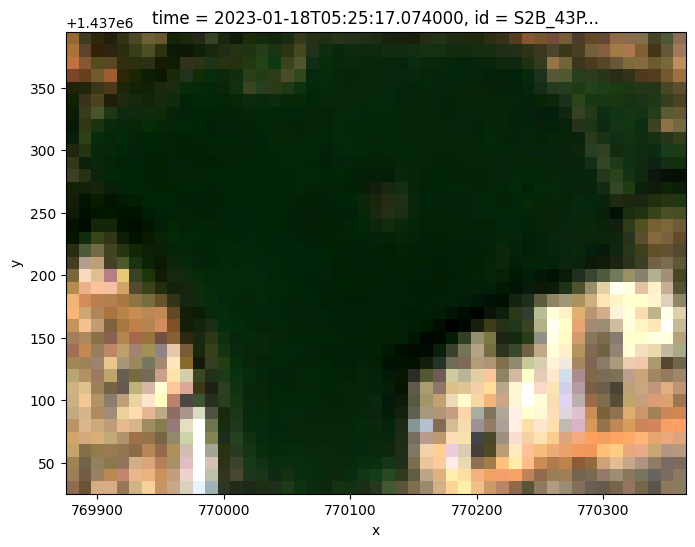

In [52]:
rgb_small.plot.imshow(robust=True, size=6);

In [53]:
# Look at all the images across the time again:
stack_small.time

<xarray.DataArray 'time' (time: 18)> Size: 144B
array(['2023-01-08T05:25:16.914000000', '2023-01-18T05:25:17.074000000',
       '2023-01-28T05:25:17.540000000', '2023-02-07T05:25:17.869000000',
       '2023-02-12T05:25:17.989000000', '2023-02-17T05:25:17.907000000',
       '2023-02-22T05:25:17.317000000', '2023-03-04T05:25:16.516000000',
       '2023-03-14T05:25:16.606000000', '2023-03-19T05:25:23.313000000',
       '2023-04-03T05:25:19.077000000', '2023-04-13T05:25:19.864000000',
       '2023-04-23T05:25:19.024000000', '2023-05-18T05:25:24.510000000',
       '2023-05-28T05:25:24.277000000', '2023-10-20T05:25:19.623000000',
       '2023-10-25T05:25:20.636000000', '2023-11-19T05:25:17.160000000'],
      dtype='datetime64[ns]')
Coordinates: (12/43)
  * time                                     (time) datetime64[ns] 144B 2023-...
    id                                       (time) <U24 2kB 'S2B_43PGQ_20230...
    s2:datatake_id                           (time) <U34 2kB 'GS2B_20230108T0...
    s2:processing_baseline                   <U5 20B '05.09'
    view:sun_azimuth                         (time) float64 144B 147.3 ... 151.5
    earthsearch:s3_path                      (time) <U80 6kB 's3://sentinel-c...
    ...                                       ...
    s2:medium_proba_clouds_percentage        (time) float64 144B 5.219 ... 0.807
    s2:granule_id                            (time) <U62 4kB 'S2B_OPER_MSI_L2...
    s2:snow_ice_percentage                   int64 8B 0
    s2:reflectance_conversion_factor         (time) float64 144B 1.034 ... 1.022
    s2:degraded_msi_data_percentage          (time) float64 144B 0.0109 ... 0...
    epsg                                     int64 8B 32643

We still need to mask for clouds in the data. Also, we get rid of duplicates as sometimes we see that there are two images at the same data.

In [54]:
stack_small = stack_small.drop_duplicates(dim="time", keep="first")
stack_small

<xarray.DataArray 'stackstac-8ee9dc36a6ff8e430998c375ac97b87b' (time: 18,
                                                                band: 32,
                                                                y: 37, x: 49)> Size: 8MB
dask.array<getitem, shape=(18, 32, 37, 49), dtype=float64, chunksize=(1, 1, 37, 49), chunktype=numpy.ndarray>
Coordinates: (12/52)
  * time                                     (time) datetime64[ns] 144B 2023-...
    id                                       (time) <U24 2kB 'S2B_43PGQ_20230...
  * band                                     (band) <U12 2kB 'aot' ... 'wvp-jp2'
  * x                                        (x) float64 392B 7.699e+05 ... 7...
  * y                                        (y) float64 296B 1.437e+06 ... 1...
    s2:datatake_id                           (time) <U34 2kB 'GS2B_20230108T0...
    ...                                       ...
    title                                    (band) <U31 4kB 'Aerosol optical...
    gsd                                      (band) object 256B None 10 ... None
    common_name                              (band) object 256B None ... None
    center_wavelength                        (band) object 256B None ... None
    full_width_half_max                      (band) object 256B None ... None
    epsg                                     int64 8B 32643
Attributes:
    spec:        RasterSpec(epsg=32643, bounds=(769880.0, 1437020.0, 770370.0...
    crs:         epsg:32643
    transform:   | 10.00, 0.00, 769880.00|\n| 0.00,-10.00, 1437390.00|\n| 0.0...
    resolution:  10.0

In [55]:
# Let us create a cloud mask. Let us also only use those bands we really need
stack_small2 = stack_small.sel(band=["red", "green", "blue", "swir16", "scl"])
stack_small2

<xarray.DataArray 'stackstac-8ee9dc36a6ff8e430998c375ac97b87b' (time: 18,
                                                                band: 5, y: 37,
                                                                x: 49)> Size: 1MB
dask.array<getitem, shape=(18, 5, 37, 49), dtype=float64, chunksize=(1, 1, 37, 49), chunktype=numpy.ndarray>
Coordinates: (12/52)
  * time                                     (time) datetime64[ns] 144B 2023-...
    id                                       (time) <U24 2kB 'S2B_43PGQ_20230...
  * band                                     (band) <U12 240B 'red' ... 'scl'
  * x                                        (x) float64 392B 7.699e+05 ... 7...
  * y                                        (y) float64 296B 1.437e+06 ... 1...
    s2:datatake_id                           (time) <U34 2kB 'GS2B_20230108T0...
    ...                                       ...
    title                                    (band) <U31 620B 'Red (band 4) -...
    gsd                                      (band) object 40B 10 10 10 20 None
    common_name                              (band) object 40B 'red' ... None
    center_wavelength                        (band) object 40B 0.665 ... None
    full_width_half_max                      (band) object 40B 0.038 ... None
    epsg                                     int64 8B 32643
Attributes:
    spec:        RasterSpec(epsg=32643, bounds=(769880.0, 1437020.0, 770370.0...
    crs:         epsg:32643
    transform:   | 10.00, 0.00, 769880.00|\n| 0.00,-10.00, 1437390.00|\n| 0.0...
    resolution:  10.0

In [56]:
## Mask for cloud:
mask_cloud = stack_small2.sel(band = 'scl')

In [57]:
to_keep = [2,4,5,6,7,11]

In [58]:
binary_valid = mask_cloud.isin(to_keep)

In [59]:
small_masked = stack_small2.where(binary_valid)
small_masked

<xarray.DataArray 'stackstac-8ee9dc36a6ff8e430998c375ac97b87b' (time: 18,
                                                                band: 5, y: 37,
                                                                x: 49)> Size: 1MB
dask.array<where, shape=(18, 5, 37, 49), dtype=float64, chunksize=(1, 1, 37, 49), chunktype=numpy.ndarray>
Coordinates: (12/46)
  * time                                     (time) datetime64[ns] 144B 2023-...
    id                                       (time) <U24 2kB 'S2B_43PGQ_20230...
  * band                                     (band) <U12 240B 'red' ... 'scl'
  * x                                        (x) float64 392B 7.699e+05 ... 7...
  * y                                        (y) float64 296B 1.437e+06 ... 1...
    s2:datatake_id                           (time) <U34 2kB 'GS2B_20230108T0...
    ...                                       ...
    s2:medium_proba_clouds_percentage        (time) float64 144B 5.219 ... 0.807
    s2:granule_id                            (time) <U62 4kB 'S2B_OPER_MSI_L2...
    s2:snow_ice_percentage                   int64 8B 0
    s2:reflectance_conversion_factor         (time) float64 144B 1.034 ... 1.022
    s2:degraded_msi_data_percentage          (time) float64 144B 0.0109 ... 0...
    epsg                                     int64 8B 32643
Attributes:
    spec:        RasterSpec(epsg=32643, bounds=(769880.0, 1437020.0, 770370.0...
    crs:         epsg:32643
    transform:   | 10.00, 0.00, 769880.00|\n| 0.00,-10.00, 1437390.00|\n| 0.0...
    resolution:  10.0

## Creating an animation

For this part, this Medium article is used:
https://towardsdatascience.com/a-simple-way-for-downloading-hundreds-of-clipped-satellite-images-without-retrieving-the-entire-f22d97501fd3

CHANCE THIS PART TO THE FUNCTION I HAVE WRITTEN WITH MATPLOTLIB FOR THE OTHER CODE

In [60]:
# Compute the number of images
no_images = stack_small.shape[0] # this has all the bands
no_images

18

## Creating a water index

There are several indices that one can create. As an example:

- Modified Normalized Difference Water Index (MNDWI)

- Sentinel-2 water index

There are many more indices for water. For an (non-exhaustive) overview, please see HERE - TO ADD

To keep things simple, only the Modified Normalised Difference Water Index (MNDWI) is computed.

### Modified Normalised Difference Water Index (MNDWI)

The formula for the MNDWI for Sentinel is (green (B3) and 'swir1' (B11))

$$
  MNDVI = \frac{Green - SWIR}{Green + SWIR}
$$

In [61]:
small_masked

<xarray.DataArray 'stackstac-8ee9dc36a6ff8e430998c375ac97b87b' (time: 18,
                                                                band: 5, y: 37,
                                                                x: 49)> Size: 1MB
dask.array<where, shape=(18, 5, 37, 49), dtype=float64, chunksize=(1, 1, 37, 49), chunktype=numpy.ndarray>
Coordinates: (12/46)
  * time                                     (time) datetime64[ns] 144B 2023-...
    id                                       (time) <U24 2kB 'S2B_43PGQ_20230...
  * band                                     (band) <U12 240B 'red' ... 'scl'
  * x                                        (x) float64 392B 7.699e+05 ... 7...
  * y                                        (y) float64 296B 1.437e+06 ... 1...
    s2:datatake_id                           (time) <U34 2kB 'GS2B_20230108T0...
    ...                                       ...
    s2:medium_proba_clouds_percentage        (time) float64 144B 5.219 ... 0.807
    s2:granule_id                            (time) <U62 4kB 'S2B_OPER_MSI_L2...
    s2:snow_ice_percentage                   int64 8B 0
    s2:reflectance_conversion_factor         (time) float64 144B 1.034 ... 1.022
    s2:degraded_msi_data_percentage          (time) float64 144B 0.0109 ... 0...
    epsg                                     int64 8B 32643
Attributes:
    spec:        RasterSpec(epsg=32643, bounds=(769880.0, 1437020.0, 770370.0...
    crs:         epsg:32643
    transform:   | 10.00, 0.00, 769880.00|\n| 0.00,-10.00, 1437390.00|\n| 0.0...
    resolution:  10.0

In [62]:
small_masked.shape

(18, 5, 37, 49)

In [63]:
test = small_masked.isel(time=0).sel(band = 'green')
test.values[0:2,0:2]

array([[ 0.0058, -0.0154],
       [ 0.0136, -0.0082]])

In [73]:
green = small_masked.sel(band = 'green')
green_correct = green *10000 + 1000
swir = small_masked.sel(band = 'swir16')
swir_correct = swir * 10000 + 1000

In [65]:
green.shape

(18, 37, 49)

To check if there is scale and offset in the data

In [223]:
# green.values

In [206]:
# scale 0.0001
# offset -0.1

In [66]:
green_stack = stack.isel(time=0).sel(band=['green']) # The entire
green_stack.values

array([[[    nan,     nan,     nan, ...,  0.0344,  0.0406,  0.032 ],
        [    nan,     nan,     nan, ...,  0.021 ,  0.0332,  0.0204],
        [    nan,     nan,     nan, ..., -0.0096,  0.0026, -0.0037],
        ...,
        [ 0.0274,  0.0158, -0.0012, ..., -0.0133, -0.0292, -0.026 ],
        [ 0.0194,  0.0064,  0.0012, ..., -0.0172, -0.0234, -0.0172],
        [ 0.0122,  0.0032,  0.0104, ..., -0.0154, -0.0175, -0.0043]]])

You see that these values match. You need to multiply with 10 000 and add 1000 and then you get the same thing.

In [67]:
green_stack.shape

(1, 10980, 10980)

In [72]:
green_stack_correct = (green_stack *10000) + 1000
green_stack_correct.values

array([[[  nan,   nan,   nan, ..., 1344., 1406., 1320.],
        [  nan,   nan,   nan, ..., 1210., 1332., 1204.],
        [  nan,   nan,   nan, ...,  904., 1026.,  963.],
        ...,
        [1274., 1158.,  988., ...,  867.,  708.,  740.],
        [1194., 1064., 1012., ...,  828.,  766.,  828.],
        [1122., 1032., 1104., ...,  846.,  825.,  957.]]])

In [69]:
green_stack.time

<xarray.DataArray 'time' ()> Size: 8B
array('2023-01-08T05:25:16.914000000', dtype='datetime64[ns]')
Coordinates: (12/43)
    time                                     datetime64[ns] 8B 2023-01-08T05:...
    id                                       <U24 96B 'S2B_43PGQ_20230108_0_L2A'
    s2:datatake_id                           <U34 136B 'GS2B_20230108T051209_...
    s2:processing_baseline                   <U5 20B '05.09'
    view:sun_azimuth                         float64 8B 147.3
    earthsearch:s3_path                      <U80 320B 's3://sentinel-cogs/se...
    ...                                       ...
    s2:medium_proba_clouds_percentage        float64 8B 5.219
    s2:granule_id                            <U62 248B 'S2B_OPER_MSI_L2A_TL_2...
    s2:snow_ice_percentage                   int64 8B 0
    s2:reflectance_conversion_factor         float64 8B 1.034
    s2:degraded_msi_data_percentage          float64 8B 0.0109
    epsg                                     int64 8B 32643

In [70]:
items[17] # This matches

<Item id=S2B_43PGQ_20230108_0_L2A>

In [71]:
greentest = rio.open_rasterio(items[17].assets["green"].href)
greentest.values

array([[[   0,    0,    0, ..., 1344, 1406, 1320],
        [   0,    0,    0, ..., 1210, 1332, 1204],
        [   0,    0,    0, ...,  904, 1026,  963],
        ...,
        [1274, 1158,  988, ...,  867,  708,  740],
        [1194, 1064, 1012, ...,  828,  766,  828],
        [1122, 1032, 1104, ...,  846,  825,  957]]], dtype=uint16)

In [218]:
# items[0]

In [207]:
greentest.shape

(1, 10980, 10980)

In [74]:
mndwi = (green_correct-swir_correct)/(green_correct + swir_correct)
mndwi

<xarray.DataArray 'stackstac-8ee9dc36a6ff8e430998c375ac97b87b' (time: 18,
                                                                y: 37, x: 49)> Size: 261kB
dask.array<truediv, shape=(18, 37, 49), dtype=float64, chunksize=(1, 37, 49), chunktype=numpy.ndarray>
Coordinates: (12/45)
  * time                                     (time) datetime64[ns] 144B 2023-...
    id                                       (time) <U24 2kB 'S2B_43PGQ_20230...
  * x                                        (x) float64 392B 7.699e+05 ... 7...
  * y                                        (y) float64 296B 1.437e+06 ... 1...
    s2:datatake_id                           (time) <U34 2kB 'GS2B_20230108T0...
    s2:processing_baseline                   <U5 20B '05.09'
    ...                                       ...
    s2:medium_proba_clouds_percentage        (time) float64 144B 5.219 ... 0.807
    s2:granule_id                            (time) <U62 4kB 'S2B_OPER_MSI_L2...
    s2:snow_ice_percentage                   int64 8B 0
    s2:reflectance_conversion_factor         (time) float64 144B 1.034 ... 1.022
    s2:degraded_msi_data_percentage          (time) float64 144B 0.0109 ... 0...
    epsg                                     int64 8B 32643

In [75]:
ndwi_example = mndwi.isel(time=1)
ndwi_example

<xarray.DataArray 'stackstac-8ee9dc36a6ff8e430998c375ac97b87b' (y: 37, x: 49)> Size: 15kB
dask.array<getitem, shape=(37, 49), dtype=float64, chunksize=(37, 49), chunktype=numpy.ndarray>
Coordinates: (12/45)
    time                                     datetime64[ns] 8B 2023-01-18T05:...
    id                                       <U24 96B 'S2B_43PGQ_20230118_0_L2A'
  * x                                        (x) float64 392B 7.699e+05 ... 7...
  * y                                        (y) float64 296B 1.437e+06 ... 1...
    s2:datatake_id                           <U34 136B 'GS2B_20230118T051139_...
    s2:processing_baseline                   <U5 20B '05.09'
    ...                                       ...
    s2:medium_proba_clouds_percentage        float64 8B 0.01379
    s2:granule_id                            <U62 248B 'S2B_OPER_MSI_L2A_TL_2...
    s2:snow_ice_percentage                   int64 8B 0
    s2:reflectance_conversion_factor         float64 8B 1.034
    s2:degraded_msi_data_percentage          float64 8B 0.0108
    epsg                                     int64 8B 32643

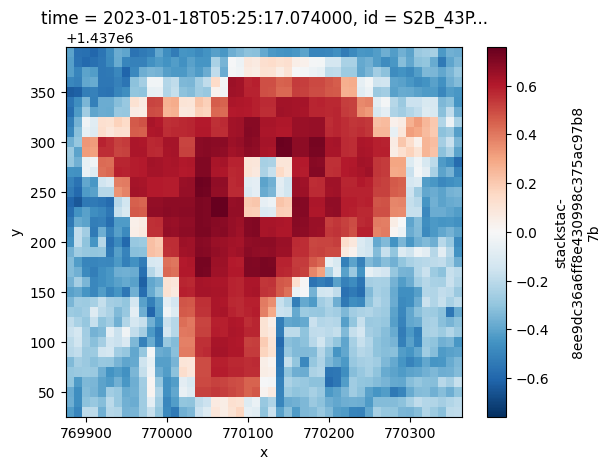

In [77]:
ndwi_example.plot() # NEED TO ADD TITLE ETC TO THIS

In [78]:
# Plot all the different NDWI over time:

In [106]:
mndwi.shape

(18, 37, 49)

## Plot the MNNWI over time

In [88]:
type(mndwi)

xarray.core.dataarray.DataArray

In [91]:
mndwi

<xarray.DataArray 'stackstac-8ee9dc36a6ff8e430998c375ac97b87b' (time: 18,
                                                                y: 37, x: 49)> Size: 261kB
dask.array<truediv, shape=(18, 37, 49), dtype=float64, chunksize=(1, 37, 49), chunktype=numpy.ndarray>
Coordinates: (12/45)
  * time                                     (time) datetime64[ns] 144B 2023-...
    id                                       (time) <U24 2kB 'S2B_43PGQ_20230...
  * x                                        (x) float64 392B 7.699e+05 ... 7...
  * y                                        (y) float64 296B 1.437e+06 ... 1...
    s2:datatake_id                           (time) <U34 2kB 'GS2B_20230108T0...
    s2:processing_baseline                   <U5 20B '05.09'
    ...                                       ...
    s2:medium_proba_clouds_percentage        (time) float64 144B 5.219 ... 0.807
    s2:granule_id                            (time) <U62 4kB 'S2B_OPER_MSI_L2...
    s2:snow_ice_percentage                   int64 8B 0
    s2:reflectance_conversion_factor         (time) float64 144B 1.034 ... 1.022
    s2:degraded_msi_data_percentage          (time) float64 144B 0.0109 ... 0...
    epsg                                     int64 8B 32643

In [93]:
mean_mndwi = mndwi.mean(("x", "y"))
mean_mndwi

<xarray.DataArray 'stackstac-8ee9dc36a6ff8e430998c375ac97b87b' (time: 18)> Size: 144B
dask.array<mean_agg-aggregate, shape=(18,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates: (12/43)
  * time                                     (time) datetime64[ns] 144B 2023-...
    id                                       (time) <U24 2kB 'S2B_43PGQ_20230...
    s2:datatake_id                           (time) <U34 2kB 'GS2B_20230108T0...
    s2:processing_baseline                   <U5 20B '05.09'
    view:sun_azimuth                         (time) float64 144B 147.3 ... 151.5
    earthsearch:s3_path                      (time) <U80 6kB 's3://sentinel-c...
    ...                                       ...
    s2:medium_proba_clouds_percentage        (time) float64 144B 5.219 ... 0.807
    s2:granule_id                            (time) <U62 4kB 'S2B_OPER_MSI_L2...
    s2:snow_ice_percentage                   int64 8B 0
    s2:reflectance_conversion_factor         (time) float64 144B 1.034 ... 1.022
    s2:degraded_msi_data_percentage          (time) float64 144B 0.0109 ... 0...
    epsg                                     int64 8B 32643

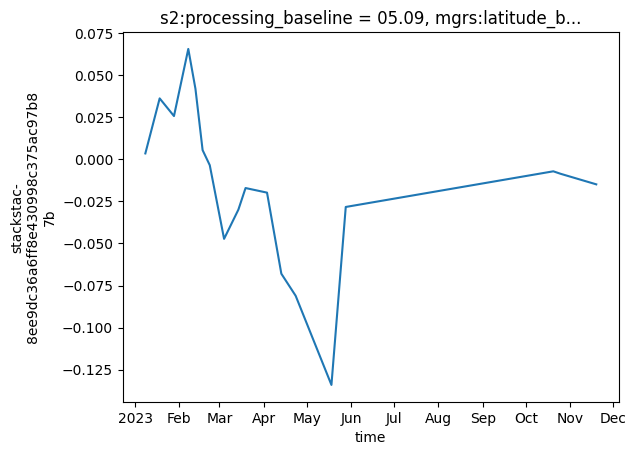

In [96]:
mean_mndwi.plot() # This needs to be clipped to the lake as the values do not make sense

## Using Landsat instead of Sentinel

In this part, the above

In [21]:
# https://stacindex.org/catalogs/usgs-landsat-collection-2-api#/?t=1 - Looks like longer time periods
catalog = Client.open('https://landsatlook.usgs.gov/stac-server')
collections = catalog.get_all_collections()

for col in collections:
  print(col)

<CollectionClient id=landsat-c2l2-sr>
<CollectionClient id=landsat-c2l2-st>
<CollectionClient id=landsat-c2ard-st>
<CollectionClient id=landsat-c2l2alb-bt>
<CollectionClient id=landsat-c2l3-fsca>
<CollectionClient id=landsat-c2ard-bt>
<CollectionClient id=landsat-c2l1>
<CollectionClient id=landsat-c2l3-ba>
<CollectionClient id=landsat-c2l2alb-st>
<CollectionClient id=landsat-c2ard-sr>
<CollectionClient id=landsat-c2l2alb-sr>
<CollectionClient id=landsat-c2l2alb-ta>
<CollectionClient id=landsat-c2l3-dswe>
<CollectionClient id=landsat-c2ard-ta>


For more information for the collections, please see here.

## Other softwares

Instead of using "plain Python", one can also use Google Earth Engine. You would have to upload the shape files. Externally. You could also use the Python API of Google Earth engine.

## Next steps
- Set no data properly including in the masking

- Other indices

- Longer time series

- Look at the chunking
-  Think if we want to do this in Google Earth Engine instead - Not sure if we are going to reach bottle necks with this code.

- Write cleaner! This was quick and dirty:)

- More detailed monitoring system

- Create an app (Streamlit, Djanjo (more difficult))

## References

https://stacspec.org/en/tutorials/reading-stac-planetary-computer/

https://towardsdatascience.com/a-simple-way-for-downloading-hundreds-of-clipped-satellite-images-without-retrieving-the-entire-f22d97501fd3

https://docs.digitalearthafrica.org/en/latest/platform_tools/odc_stac.html